In [1]:
from IPython.display import clear_output

In [2]:
!apt-get install gcc-4.8 gcc-5 g++-4.8 g++-5
!apt-get install libblas-dev liblapack-dev
!apt-get install libopenblas-dev
!apt-get install gfortran-4.8
!apt-get install gfortran-5
!apt-get install scons
!apt-get install libpng-dev
!apt-get install libboost-all-dev freeglut3-dev
!apt-get install xvfb
!apt-get install libspatialindex-dev
clear_output()

In [3]:
!pip install torch==1.3.0 rtree trimesh
clear_output()

In [4]:
!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-4.8 10
!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 20
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-4.8 10
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 20
clear_output()

In [5]:
%cd /content

/content


In [6]:
!git clone https://github.com/mszarski/diffsim.git

Cloning into 'diffsim'...
remote: Enumerating objects: 1209, done.
remote: Counting objects: 100% (1209/1209), done.
remote: Compressing objects: 100% (786/786), done.
remote: Total 1209 (delta 427), reused 1056 (delta 301), pack-reused 0
Receiving objects: 100% (1209/1209), 27.80 MiB | 24.82 MiB/s, done.
Resolving deltas: 100% (427/427), done.


In [7]:
!chmod +x diffsim/arcsim/dependencies/taucs/configure

In [8]:
%cd /content

/content


In [9]:
%cd diffsim
!update-alternatives --set gcc "/usr/bin/gcc-4.8"
!update-alternatives --set g++ "/usr/bin/g++-4.8"
%cd arcsim/dependencies/
!make 
%cd ../..
!update-alternatives --set gcc "/usr/bin/gcc-5"
!update-alternatives --set g++ "/usr/bin/g++-5"
!make -j 8
%cd pysim
!ln -s ../arcsim/conf ./conf
!ln -s ../arcsim/materials ./materials
!ln -s ../arcsim/meshes ./meshes

clear_output()

In [ ]:
##restart runtime here

In [1]:
%cd /content/diffsim/pysim

/content/diffsim/pysim


In [2]:
from google.colab import drive
from os.path import join

ROOT = '/content/drive'     # default for the drive
PROJ = 'My Drive/draping_workspace'       # path to your project on Drive

drive.mount(ROOT)

Mounted at /content/drive


In [3]:
inital_fabric_mesh_path = "/content/drive/My Drive/draping_workspace/double_hump_mm_flatmesh_simplified_99pc.obj"
tool_mesh_path = "/content/drive/My Drive/draping_workspace/double_hump_mm_simplified.obj"
handles = [24, 2, 153, 124]
boundary = [ 26,  63,  91,  62,  61, 116, 124,  93, 105,  27, 157,  78,  66,
          7, 153, 103, 129,  88, 122,  99,  89, 142, 149,  44,   6, 126,
         24,  60,  21,  11,  49, 150, 136, 139,   2,  53, 117,  36,   0]
fabric_t = [-0.1,-0.3,0.7]
tool_t = [-0.1,-0.3,-0.5]
scale = 0.01 
seed_pt_idx = 83

In [4]:
import trimesh
import trimesh.transformations as tf
import numpy as np

curved_mesh = trimesh.load(tool_mesh_path,process=False)
flat_mesh = trimesh.load(inital_fabric_mesh_path,process=False)
scene = trimesh.Scene(base_frame='world')

curved_mesh.apply_scale(scale)
flat_mesh.apply_scale(scale)

transform = tf.translation_matrix(fabric_t)
flat_mesh.apply_transform(transform)
f_id = scene.add_geometry(flat_mesh)


transform = tf.translation_matrix(tool_t)
curved_mesh.apply_transform(transform)
c_id = scene.add_geometry(curved_mesh)

#scene.show()

In [5]:
import networkx as nx
import torch
import itertools

torch_curved_v = torch.tensor(curved_mesh.vertices,dtype=torch.float64)
torch_tool_v = torch.tensor(curved_mesh.vertices, dtype=torch.float64)
torch_tool_n = torch.tensor(curved_mesh.vertex_normals, dtype=torch.float64)

#precalculate all pairs shortest paths
G = nx.Graph()
G.add_edges_from(flat_mesh.edges_unique)
P = dict(nx.all_pairs_shortest_path(G))

def calculate_rings(seed_pt_idx, boundary):
    rings = []
    rings.append([seed_pt_idx])
    while True:
        next_ring = [list(G[i].keys()) for i in rings[-1]]
        next_ring_no_center = set(itertools.chain(*next_ring)) - set(itertools.chain(*rings))
        rings.append(list(next_ring_no_center))
        if set(boundary) <= set(itertools.chain(*rings)):
            return rings[1:]

rings = calculate_rings(seed_pt_idx, boundary)

def ring_contact_loss_normal(sim, rings,thresh = 5e-3):

    dists = []
    for i in range(len(sim.cloths[0].mesh.nodes)):
        dists.append(torch.dot(sim.cloths[0].mesh.nodes[i].x - torch_tool_v[i],torch_tool_n[i]))

    #n_dists = torch.einsum('ij,ij->i', torch_fabric_v - torch_tool_v, torch_tool_n)

    n_dists = torch.stack(dists)
    pos_n_dists = torch.nn.functional.relu(n_dists)
    # weights = torch.exp(-pos_n_dists/thresh)

    ring_weights = np.linspace(10,0,len(rings))

    contact = torch.tensor(0.0)

    for i in range(len(rings)):
        contact += pos_n_dists[rings[i]].mean()*ring_weights[i]

    return contact

def total_contact_loss_dist_normal(sim, exclude_indices = None, thresh = 5e-3):

    if exclude_indices is None: 
        exclude_indices = []

    one_rings = [list(G[i].keys()) for i in exclude_indices]
    exclude_indices.append(list(itertools.chain(*one_rings)))

    dists = []
    for i in range(len(sim.cloths[0].mesh.nodes)):
        if not i in exclude_indices:
            dists.append(torch.dot(sim.cloths[0].mesh.nodes[i].x - torch_tool_v[i],torch_tool_n[i]))

    n_dists = torch.stack(dists)

    pos_z_dists = torch.nn.functional.relu(n_dists)
    # contact_loss = torch.mean(torch.exp(-pos_z_dists/thresh))

    contact_loss = torch.mean(pos_z_dists)

    return contact_loss

In [6]:
import arcsim
import json
import os

def run(phase_config):
  torch.manual_seed(0)
  np.random.seed(0)
  torch.set_num_threads(8)

  if not os.path.exists(phase_config['out_path']):
    os.mkdir(phase_config['out_path'])

  config = json.loads(phase_config['json_config'])

  with open(phase_config['out_path']+'/conf.json','w') as f:
    json.dump(config, f)

  sim=arcsim.get_sim()

  param_v = torch.zeros([phase_config['steps'], 4,3],dtype=torch.float64, requires_grad=True)

  optimizer = torch.optim.Adam([param_v],phase_config['lr'])
  scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=2, verbose=True)

  epoch = 0
  while True:

    if epoch < phase_config['epochs']:
      arcsim.init_physics(phase_config['out_path']+'/conf.json', phase_config['out_path']+'/out%d'%epoch,False)
    else:
      arcsim.init_physics(phase_config['out_path']+'/conf.json',phase_config['out_path']+'/out',False)

    optimizer.zero_grad()

    loss = phase_config['run_sim'](sim, param_v, phase_config['pre_steps'], phase_config['steps'])

    loss.backward(retain_graph=True)

    optimizer.step()

    arcsim.delete_mesh(sim.cloths[0].mesh)

    scheduler.step(loss.item())

    if epoch>=phase_config['epochs']:
      break
    epoch = epoch + 1

  return param_v


In [7]:
def phase1_sim(sim,param_v, pre_steps, steps):

  seed_pt_losses = []
  contact_losses = []
  step_seed_pt_contact_losses = []

  print("step")
  for step in range(pre_steps + steps):

    if step > pre_steps-1:
      for i in range(len(handles)):
        sim.cloths[0].mesh.nodes[handles[i]].v += param_v[step-pre_steps,i] #* spf
  
      step_seed_pt_dist = torch.dot(sim.cloths[0].mesh.nodes[seed_pt_idx].x - torch_tool_v[seed_pt_idx],torch_tool_n[seed_pt_idx])
      n_dist = torch.nn.functional.relu(step_seed_pt_dist)
      thresh = 5e-3
      step_seed_pt_contact_loss = -torch.sum(torch.exp(-n_dist/thresh))
      step_seed_pt_contact_losses.append(step_seed_pt_contact_loss)

      step_seed_pt_loss = torch.norm(sim.cloths[0].mesh.nodes[seed_pt_idx].x - sim.obstacles[0].curr_state_mesh.nodes[seed_pt_idx].x)
      seed_pt_losses.append(step_seed_pt_loss)

      step_contact_loss = -total_contact_loss_dist_normal(sim,[seed_pt_idx],5e-3)
      contact_losses.append(step_contact_loss)

    arcsim.sim_step()

  contact_loss_steps = torch.stack(contact_losses,dim=0)
  contact_loss = torch.sum(contact_loss_steps)

  step_seed_pt_contact_loss_steps = torch.stack(step_seed_pt_contact_losses,dim=0)
  seed_pt_contact_loss = -torch.logsumexp(-step_seed_pt_contact_loss_steps*1000,0)/1000
         
  seed_pt_loss_steps = torch.stack(seed_pt_losses,dim=0)
  seed_pt_loss = torch.sum(seed_pt_loss_steps)

  print(f"contact loss: {contact_loss}, seed_pt_loss: {seed_pt_loss} seed_pt_contact_loss: {seed_pt_contact_loss}")

  total_loss = seed_pt_loss + seed_pt_contact_loss + contact_loss
  
  return total_loss


def phase2_sim(sim,param_v, pre_steps, steps):

  boundary_losses = []
  contact_losses = []

  print("step")
  for step in range(pre_steps + steps):

    if step > pre_steps-1:
      for i in range(len(handles)):
        sim.cloths[0].mesh.nodes[handles[i]].v += param_v[step-pre_steps,i] #* spf
  
      step_contact_loss = ring_contact_loss_normal(sim,rings)
      contact_losses.append(step_contact_loss)

      loss_idxs = [*handles]
      step_boundary_loss = torch.tensor(0.0)
      for i in loss_idxs:
        w = 1
        step_boundary_loss += w*torch.norm(sim.cloths[0].mesh.nodes[i].x - sim.obstacles[0].curr_state_mesh.nodes[i].x)

      boundary_losses.append(step_boundary_loss)

    arcsim.sim_step()

  contact_loss_steps = torch.stack(contact_losses,dim=0)
  contact_loss = torch.mean(contact_loss_steps)
         
  boundary_loss_steps = torch.stack(boundary_losses,dim=0)
  boundary_loss = torch.mean(boundary_loss_steps)

  boundary_loss = boundary_loss*10

  contact_loss = contact_loss*1

  print(f"contact loss: {contact_loss}, boundary_loss: {boundary_loss}")

  total_loss = boundary_loss + contact_loss

  return total_loss

def phase3_sim(sim,param_v, pre_steps, steps):

  phase1 = torch.load('phase1.pt')
  phase2 = torch.load('phase2.pt')
  param_v = torch.cat([phase1,phase2],dim=0)

  positions = np.zeros((steps,4,3),dtype=np.float64)

  print("step")
  for step in range(pre_steps + steps):

    if step > pre_steps-1:
      for i in range(len(handles)):
        sim.cloths[0].mesh.nodes[handles[i]].v += param_v[step-pre_steps,i] #* spf
        positions[step-pre_steps,i] = sim.cloths[0].mesh.nodes[handles[i]].x.detach().numpy()
  
    arcsim.sim_step()

  np.save('positions.npy', positions)
  return torch.norm(sim.cloths[0].mesh.nodes[seed_pt_idx].x - torch_tool_v[i])

In [8]:
phase1_config = {
    'lr':0.01,
    'run_sim':phase1_sim,
    'epochs':20,
    'pre_steps':5,
    'steps':20,
    'out_path' : '/content/double_hump_draping_phase1_out',
    'json_config' : f"""
    {{
    "frame_time": 0.125,
    "frame_steps": 1,
    "end_time": 10,
    "cloths": [
    {{
        "mesh": "{inital_fabric_mesh_path}",
        "transform":{{"scale":{scale},"translate":{fabric_t}}},
        "materials": [{{"data": "materials/gray-interlock.json",
                       "thicken": 2}}]
    }}
    ],
    "obstacles": [
    {{
        "mesh": "{tool_mesh_path}",
        "transform":{{"scale":{scale},"translate":{tool_t}}},
        "velocity": [0, 0, 0, 0, 0, 0],
        "movable": 0
    }}
    ],
    "disable":["remeshing", "proximity"],
    "handles": [{{"nodes": [24, 2, 153, 124]}}],
    "gravity":[0, 0, -9.8],
    "magic": {{"repulsion_thickness": 5e-3, "collision_stiffness": 1e6}}
    }}"""
}

phase2_config = {
    'lr':0.05,
    'run_sim':phase2_sim,
    'epochs':10,
    'pre_steps':0,
    'steps':20,
    'out_path' : '/content/double_hump_draping_phase2_out',
    'json_config' : f"""
    {{
    "frame_time": 0.125,
    "frame_steps": 1,
    "end_time": 10,
    "cloths": [
    {{
        "mesh": "/content/double_hump_draping_phase1_out/out/0025_000.obj",
        "materials": [{{"data": "materials/gray-interlock.json",
                       "thicken": 2}}]
    }}
    ],
    "obstacles": [
    {{
        "mesh": "{tool_mesh_path}",
        "transform":{{"scale":{scale},"translate":{tool_t}}},
        "velocity": [0, 0, 0, 0, 0, 0],
        "movable": 0
    }}
    ],
    "disable":["remeshing", "proximity"],
    "handles": [{{"nodes": [24, 2, 153, 124]}}],
    "gravity":[0, 0, -9.8],
    "magic": {{"repulsion_thickness": 5e-3, "collision_stiffness": 1e6}}
    }}"""
}

phase3_config = {
    'lr':0.01,
    'run_sim':phase3_sim,
    'epochs':0,
    'pre_steps':5,
    'steps':40,
    'out_path' : '/content/double_hump_draping_phase3_out',
    'json_config' : f"""
    {{
    "frame_time": 0.125,
    "frame_steps": 1,
    "end_time": 10,
    "cloths": [
    {{
        "mesh": "{inital_fabric_mesh_path}",
        "transform":{{"scale":{scale},"translate":{fabric_t}}},
        "materials": [{{"data": "materials/gray-interlock.json",
                       "thicken": 2}}]
    }}
    ],
    "obstacles": [
    {{
        "mesh": "{tool_mesh_path}",
        "transform":{{"scale":{scale},"translate":{tool_t}}},
        "velocity": [0, 0, 0, 0, 0, 0],
        "movable": 0
    }}
    ],
    "disable":["remeshing", "proximity"],
    "handles": [{{"nodes": [24, 2, 153, 124]}}],
    "gravity":[0, 0, -9.8],
    "magic": {{"repulsion_thickness": 5e-3, "collision_stiffness": 1e6}}
    }}"""
}

In [9]:
phase1_v = run(phase1_config)
torch.save(phase1_v, 'phase1.pt')

step
contact loss: -9.960499323938729, seed_pt_loss: 7.5435661238960225 seed_pt_contact_loss: -0.0029957322735539907
step
contact loss: -9.714202932242978, seed_pt_loss: 7.1458172450856265 seed_pt_contact_loss: -0.0029957322735539907
step
contact loss: -9.439968641631689, seed_pt_loss: 6.738110530717903 seed_pt_contact_loss: -0.0029957322735539946
step
contact loss: -9.180623710083346, seed_pt_loss: 6.363748256400909 seed_pt_contact_loss: -0.0029957322735552406
step
contact loss: -8.911437882700888, seed_pt_loss: 5.986946896409672 seed_pt_contact_loss: -0.0029957322742120906
step
contact loss: -8.648176627931367, seed_pt_loss: 5.622887629069544 seed_pt_contact_loss: -0.002995732546977141
step
contact loss: -8.399008882597728, seed_pt_loss: 5.277532448732503 seed_pt_contact_loss: -0.0029958318794952167
step
contact loss: -8.183873460869878, seed_pt_loss: 4.982298370651228 seed_pt_contact_loss: -0.003007016385726899
step
contact loss: -7.992846156575661, seed_pt_loss: 4.711844343984226 s

In [10]:
phase2_v = run(phase2_config)
torch.save(phase2_v, 'phase2.pt')

step
contact loss: 5.516896724700928, boundary_loss: 40.748321533203125
step
contact loss: 4.677128791809082, boundary_loss: 38.02477264404297
step
contact loss: 4.067790985107422, boundary_loss: 35.39236831665039
step
contact loss: 3.4498775005340576, boundary_loss: 33.09962463378906
step
contact loss: 2.983811855316162, boundary_loss: 30.831985473632812
step
contact loss: 2.6829280853271484, boundary_loss: 28.755102157592773
step
contact loss: 2.4223697185516357, boundary_loss: 26.757808685302734
step
contact loss: 2.1801469326019287, boundary_loss: 24.798593521118164
step
contact loss: 1.948635458946228, boundary_loss: 23.019939422607422
step
contact loss: 1.7986581325531006, boundary_loss: 21.47883415222168
step
contact loss: 1.7432037591934204, boundary_loss: 20.816715240478516


In [11]:
_ = run(phase3_config)
phase3_v = torch.cat([phase1_v,phase2_v],dim=0)

step


In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
vis_directory = '/content/double_hump_draping_phase3_out/out'

In [ ]:
%%writetemplate visualize.py
import torch
import arcsim

with torch.autograd.profiler.profile() as prof:
	  arcsim.msim(4,['arcsim','replay','{vis_directory}', '90.0'])
print(prof)

main
4
arcsim replay /content/double_hump_draping_phase3_out/out
reply 1 
reply 2 
reply 3 
reply 4 
reply 5 
reply 6 
/content/double_hump_draping_phase3_out/out/0000_
/content/double_hump_draping_phase3_out/out/0000_rig
reply 7 
90.0
90
/content/double_hump_draping_phase3_out/out/0000.bmp
/content/double_hump_draping_phase3_out/out/0001_
/content/double_hump_draping_phase3_out/out/0001_rig
/content/double_hump_draping_phase3_out/out/0001.bmp
/content/double_hump_draping_phase3_out/out/0002_
/content/double_hump_draping_phase3_out/out/0002_rig
/content/double_hump_draping_phase3_out/out/0002.bmp
/content/double_hump_draping_phase3_out/out/0003_
/content/double_hump_draping_phase3_out/out/0003_rig
/content/double_hump_draping_phase3_out/out/0003.bmp
/content/double_hump_draping_phase3_out/out/0004_
/content/double_hump_draping_phase3_out/out/0004_rig
/content/double_hump_draping_phase3_out/out/0004.bmp
/content/double_hump_draping_phase3_out/out/0005_
/content/double_hump_draping_phase

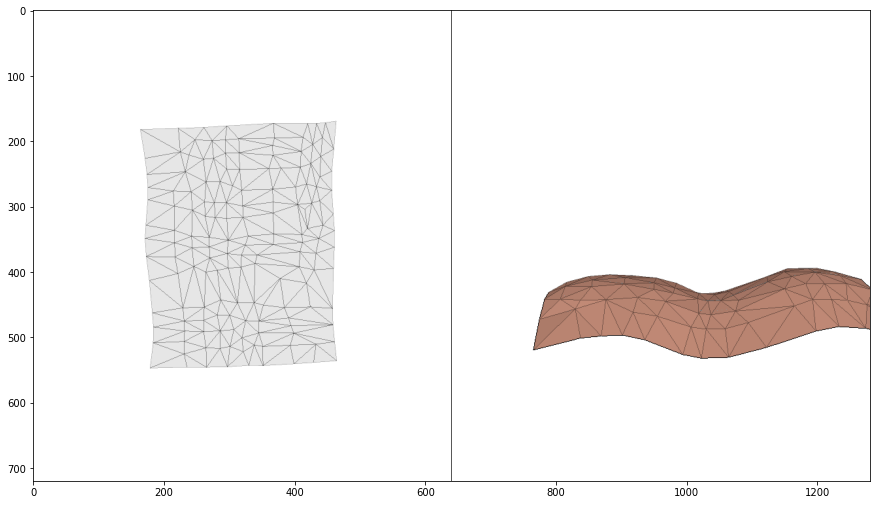

In [ ]:
!xvfb-run -e /dev/stdout -s "-screen 0 2560x1440x24 -ac +extension GLX +render -noreset" python visualize.py

import pathlib
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt

frames = []
for bmp_file in sorted(list(pathlib.Path(vis_directory).glob('*.bmp'))):
    frames.append(plt.imread(bmp_file))
    #print(bmp_file)
    
from matplotlib import animation, rc
from IPython.display import HTML

plt.rcParams["figure.figsize"] = (15,15)

fig = plt.figure()

ims = []
for i in range(len(frames)):
    im = plt.imshow(frames[i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

rc('animation', html='jshtml')
ani

In [ ]:
ani.save('allphases.mp4')

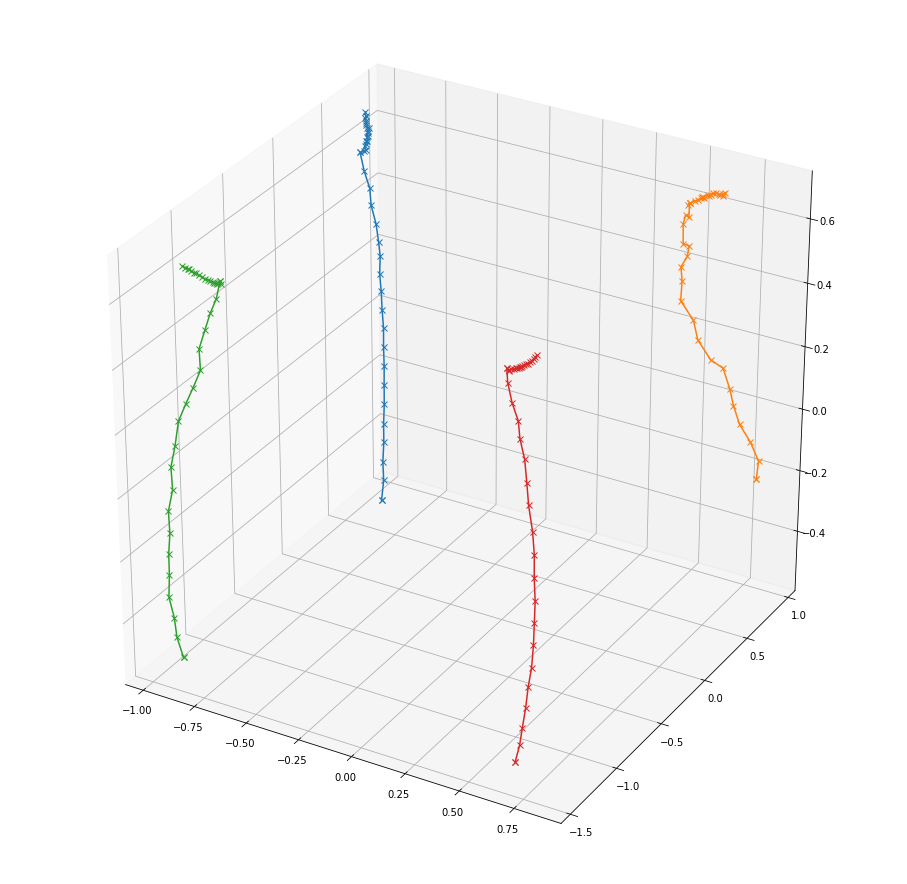

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(111, projection = '3d')

for i in range(len(handles)):
    trajectory = (np.cumsum(phase3_v.detach().numpy()[:,i,:]*0.125,axis=0) + flat_mesh.vertices[handles[i]]).T
    ax.plot(trajectory[0], trajectory[1], trajectory[2], marker = 'x')

plt.show()

In [44]:
scene = trimesh.Scene(base_frame='world')

flat_mesh.visual.vertex_colors = [209, 158, 135, 255]
f_id = scene.add_geometry(flat_mesh)
c_id = scene.add_geometry(curved_mesh)

steps = 40

trajectories = []

for handle in handles:
    ray_origin = flat_mesh.vertices[handle]
    
    ray_direction = curved_mesh.vertices[handle] - flat_mesh.vertices[handle]
    ray_direction = ray_direction

    locations, index_ray, index_tri = curved_mesh.ray.intersects_location(
        ray_origins=np.array([ray_origin]),
        ray_directions=np.array([ray_direction]))

    location = locations[0]
    path = np.dstack([np.linspace(ray_origin[0],location[0],steps),np.linspace(ray_origin[1],location[1],steps),np.linspace(ray_origin[2],location[2],steps)])

    path = path.squeeze()
    trajectories.append(path)

trajectories = np.array(trajectories) #this is positions, not vs
trajectories = np.diff(trajectories,axis=1) #vs
trajectories = trajectories.transpose(1,0,2)
trajectories = np.concatenate([trajectories,np.expand_dims(np.zeros_like(trajectories[0]),0)])
trajectories_torch = torch.tensor(trajectories)

path = np.load('positions.npy')

for i in range(len(handles)):
    original_path = trimesh.load_path(np.cumsum(trajectories[:,i,:],axis=0) + flat_mesh.vertices[handles[i]])
    scene.add_geometry(original_path)
    #optimized_path = trimesh.load_path(np.cumsum(phase3_v.detach().numpy()[:-2,i,:]*0.125,axis=0) + flat_mesh.vertices[handles[i]])
    #scene.add_geometry(optimized_path)
    scene.add_geometry(trimesh.load_path(path[:,i,:]))


scene.show()

In [45]:
def ring_metric(sim, rings,thresh = 5e-3):

    dists = []
    for i in range(len(sim.cloths[0].mesh.nodes)):
        dists.append(torch.dot(sim.cloths[0].mesh.nodes[i].x - torch_tool_v[i],torch_tool_n[i]))

    #n_dists = torch.einsum('ij,ij->i', torch_fabric_v - torch_tool_v, torch_tool_n)

    n_dists = torch.stack(dists)
    pos_n_dists = torch.nn.functional.relu(n_dists)
    # weights = torch.exp(-pos_n_dists/thresh)

    contact_mean = torch.zeros(len(rings))
    contact_min = torch.zeros(len(rings))


    for i in range(len(rings)):
        contact_mean[i] = pos_n_dists[rings[i]].mean()
        contact_min[i] = pos_n_dists[rings[i]].min()

    return contact_mean, contact_min

In [46]:
def phase4_sim(sim,param_v, pre_steps, steps):

  positions = np.zeros((steps,4,3),dtype=np.float64)

  phase1 = torch.load('phase1.pt')
  phase2 = torch.load('phase2.pt')
  param_v = torch.cat([phase1,phase2],dim=0)

  dists = np.zeros((steps,),dtype=np.float64)
  contact_loss = np.zeros((steps,),dtype=np.float64)
  ring_metric_value_mean = np.zeros((steps,len(rings)),dtype=np.float64)
  ring_metric_value_min = np.zeros((steps,len(rings)),dtype=np.float64)


  linear = False

  print("step")
  for step in range(pre_steps + steps):

    if step > pre_steps-1:
      for i in range(len(handles)):
        if linear:
          sim.cloths[0].mesh.nodes[handles[i]].v += trajectories_torch[step-pre_steps,i] * 8.0
        else:
          sim.cloths[0].mesh.nodes[handles[i]].v += param_v[step-pre_steps,i]
        positions[step-pre_steps,i] = sim.cloths[0].mesh.nodes[handles[i]].x.detach().numpy()

      # step_contact_loss = total_contact_loss_dist_normal(sim,[],5e-3)
      # step_contact_loss = ring_contact_loss_normal(sim,rings)
      # contact_loss[step-pre_steps] = step_contact_loss
      # print(step_contact_loss)
      # step_seed_pt_dist = torch.dot(sim.cloths[0].mesh.nodes[seed_pt_idx].x - torch_tool_v[seed_pt_idx],torch_tool_n[seed_pt_idx])
      # dists[step-pre_steps] = step_seed_pt_dist.detach().numpy()

      mean,min = ring_metric(sim,rings)
      ring_metric_value_mean[step-pre_steps,:] = mean.detach().numpy()
      ring_metric_value_min[step-pre_steps,:] = min.detach().numpy()
      #print(step_seed_pt_dist)
  
    arcsim.sim_step()

  if linear:
    prefix = 'linear'
  else:
    prefix = 'planned'

  np.save(f'{prefix}_positions.npy', positions)
  np.save(f'{prefix}_contact_loss.npy', contact_loss)
  np.save(f'{prefix}_seed_pt_distances.npy', dists)
  np.save(f'{prefix}_ring_metric_value_mean.npy', ring_metric_value_mean)
  np.save(f'{prefix}_ring_metric_value_min.npy', ring_metric_value_min)

  return torch.norm(sim.cloths[0].mesh.nodes[seed_pt_idx].x - torch_tool_v[i])

In [47]:
phase4_config = {
    'lr':0.01,
    'run_sim':phase4_sim,
    'epochs':0,
    'pre_steps':5,
    'steps':40,
    'out_path' : '/content/double_hump_draping_phase4_out',
    'json_config' : f"""
    {{
    "frame_time": 0.125,
    "frame_steps": 1,
    "end_time": 10,
    "cloths": [
    {{
        "mesh": "{inital_fabric_mesh_path}",
        "transform":{{"scale":{scale},"translate":{fabric_t}}},
        "materials": [{{"data": "materials/gray-interlock.json",
                       "thicken": 2}}]
    }}
    ],
    "obstacles": [
    {{
        "mesh": "{tool_mesh_path}",
        "transform":{{"scale":{scale},"translate":{tool_t}}},
        "velocity": [0, 0, 0, 0, 0, 0],
        "movable": 0
    }}
    ],
    "disable":["remeshing", "proximity"],
    "handles": [{{"nodes": [24, 2, 153, 124]}}],
    "gravity":[0, 0, -9.8],
    "magic": {{"repulsion_thickness": 5e-3, "collision_stiffness": 1e6}}
    }}"""
}

In [48]:
_ = run(phase4_config)

step


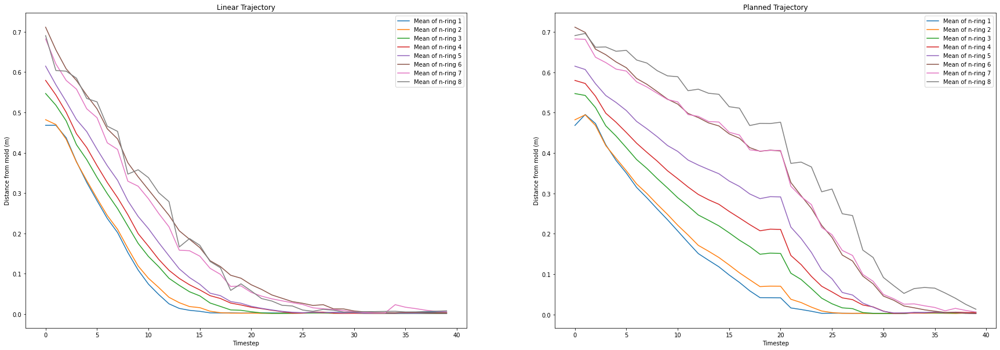

In [ ]:
linear_metrics_mean = np.load('linear_ring_metric_value_mean.npy')
optimized_metrics_mean = np.load('planned_ring_metric_value_mean.npy')

plt.figure(figsize=(30,10))
plt.subplot(1, 2, 1)
plt.plot(linear_metrics_mean[:,1:9]) #we dont plot the final edge ring because the handle distances are not relevant
plt.gca().legend(('Mean of n-ring 1','Mean of n-ring 2','Mean of n-ring 3','Mean of n-ring 4','Mean of n-ring 5','Mean of n-ring 6','Mean of n-ring 7','Mean of n-ring 8'))
plt.xlabel('Timestep')
plt.ylabel('Distance from mold (m)')
plt.title('Linear Trajectory')
plt.grid(False)

plt.subplot(1, 2, 2)
plt.plot(optimized_metrics_mean[:,1:9]) #we dont plot the final edge ring because the handle distances are not relevant
plt.gca().legend(('Mean of n-ring 1','Mean of n-ring 2','Mean of n-ring 3','Mean of n-ring 4','Mean of n-ring 5','Mean of n-ring 6','Mean of n-ring 7','Mean of n-ring 8'))
plt.xlabel('Timestep')
plt.ylabel('Distance from mold (m)')
plt.title('Planned Trajectory')
plt.grid(False)


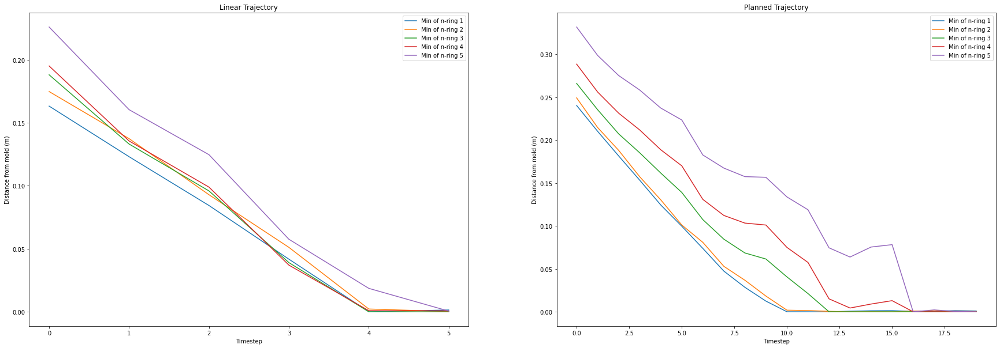

In [ ]:
linear_metrics_min = np.load('linear_ring_metric_value_min.npy')
optimized_metrics_min = np.load('planned_ring_metric_value_min.npy')

plt.figure(figsize=(30,10))
plt.subplot(1, 2, 1)
plt.plot(linear_metrics_min[5:11,1:6]) #we dont plot the final edge ring because the handle distances are not relevant
plt.gca().legend(('Min of n-ring 1','Min of n-ring 2','Min of n-ring 3','Min of n-ring 4','Min of n-ring 5','Min of n-ring 6','Min of n-ring 7','Min of n-ring 8'))
plt.xlabel('Timestep')
plt.ylabel('Distance from mold (m)')
plt.title('Linear Trajectory')
plt.grid(False)

plt.subplot(1, 2, 2)
plt.plot(optimized_metrics_min[5:25,1:6]) #we dont plot the final edge ring because the handle distances are not relevant
plt.gca().legend(('Min of n-ring 1','Min of n-ring 2','Min of n-ring 3','Min of n-ring 4','Min of n-ring 5','Min of n-ring 6','Min of n-ring 7','Min of n-ring 8'))
plt.xlabel('Timestep')
plt.ylabel('Distance from mold (m)')
plt.title('Planned Trajectory')
plt.grid(False)


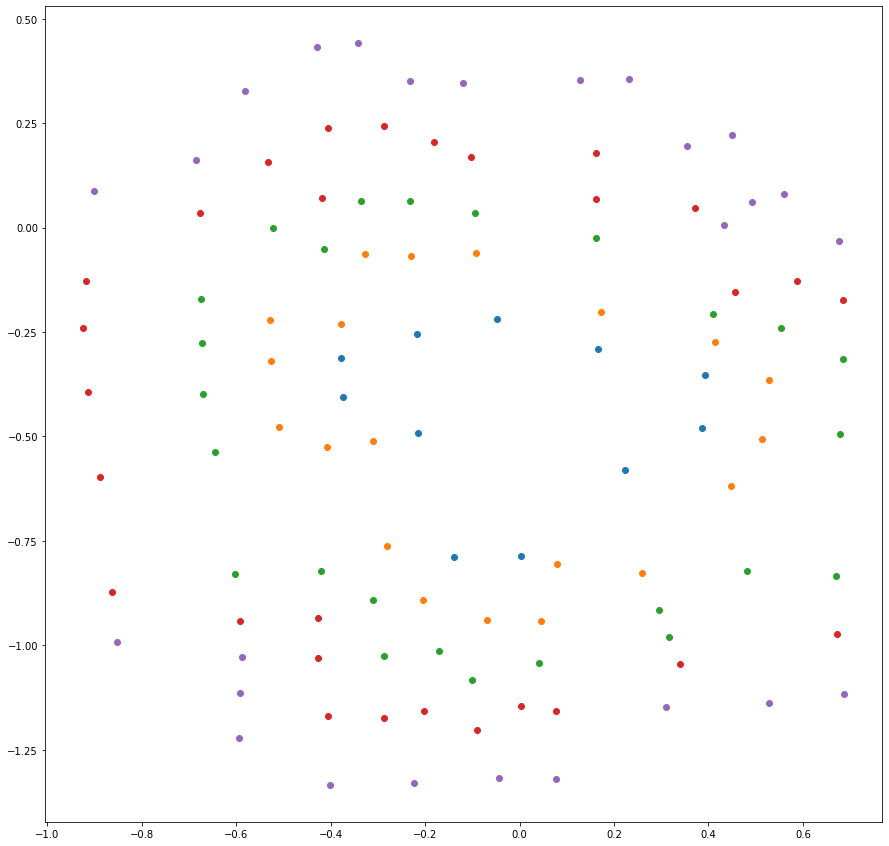

In [ ]:
xy = flat_mesh.vertices[:,0:2]

for i in range(1,6):
  plt.scatter(xy[rings[i],0], xy[rings[i],1])

In [ ]:
scene = trimesh.Scene(base_frame='world')

# flat_mesh.visual.vertex_colors = [209, 158, 135, 255]
flat_mesh.visual.vertex_colors = [0, 0, 0, 255]


f_id = scene.add_geometry(flat_mesh)
c_id = scene.add_geometry(curved_mesh)

ring_colours = [[31,119,180],[255,127,14],[44,160,44],[214,39,40],[148,103,189]]

for i in range(1,6):
  for j in rings[i]:
    p = trimesh.creation.icosphere(radius=0.025)
    p.apply_translation(flat_mesh.vertices[j])
    p.visual.vertex_colors = ring_colours[i-1]
    scene.add_geometry(p)
  # p = trimesh.points.PointCloud(vertices = flat_mesh.vertices[rings[i]], colors=ring_colours[i-1])
  # scene.add_geometry(p)

steps = 40

trajectories = []

for handle in handles:
    ray_origin = flat_mesh.vertices[handle]
    
    ray_direction = curved_mesh.vertices[handle] - flat_mesh.vertices[handle]
    ray_direction = ray_direction

    locations, index_ray, index_tri = curved_mesh.ray.intersects_location(
        ray_origins=np.array([ray_origin]),
        ray_directions=np.array([ray_direction]))

    location = locations[0]
    path = np.dstack([np.linspace(ray_origin[0],location[0],steps),np.linspace(ray_origin[1],location[1],steps),np.linspace(ray_origin[2],location[2],steps)])

    path = path.squeeze()
    trajectories.append(path)

trajectories = np.array(trajectories) #this is positions, not vs
trajectories = np.diff(trajectories,axis=1) #vs
trajectories = trajectories.transpose(1,0,2)
trajectories = np.concatenate([trajectories,np.expand_dims(np.zeros_like(trajectories[0]),0)])
trajectories_torch = torch.tensor(trajectories)

path = np.load('positions.npy')

for i in range(len(handles)):
    original_path = trimesh.load_path(np.cumsum(trajectories[:,i,:],axis=0) + flat_mesh.vertices[handles[i]])
    scene.add_geometry(original_path)
    #optimized_path = trimesh.load_path(np.cumsum(phase3_v.detach().numpy()[:-2,i,:]*0.125,axis=0) + flat_mesh.vertices[handles[i]])
    #scene.add_geometry(optimized_path)
    scene.add_geometry(trimesh.load_path(path[:,i,:]))


scene.show()

In [49]:
optimized_positions = np.load('planned_positions.npy')[35:40]
linear_positions = np.load('linear_positions.npy')[35:40]
target_positions = np.array([curved_mesh.vertices[handles[0]],curved_mesh.vertices[handles[1]],curved_mesh.vertices[handles[2]],curved_mesh.vertices[handles[3]]])

In [51]:
np.mean(linear_positions - target_positions,axis=2)

array([[-0.00895968, -0.02763703,  0.04266825,  0.05517879],
       [-0.01099072, -0.04249924,  0.03209966,  0.05638616],
       [-0.01358297, -0.05751147,  0.02198938,  0.05692659],
       [-0.01692746, -0.07199663,  0.01262536,  0.05659247],
       [-0.01981345, -0.08700165,  0.00389485,  0.05730281]])

In [54]:
np.mean(np.mean(linear_positions - target_positions,axis=2)[4])

-0.011404360664666725

In [55]:
np.mean(optimized_positions - target_positions,axis=2)

array([[ 0.01357047,  0.08025803,  0.02173054,  0.0282351 ],
       [-0.00323453,  0.07275362, -0.00703994,  0.01635323],
       [-0.01696529,  0.07540027, -0.01949101,  0.00497542],
       [-0.02516563,  0.06968579, -0.03431241, -0.00059851],
       [-0.04182698,  0.04250172, -0.04095336, -0.01005259]])

In [56]:
np.mean(np.mean(linear_positions - target_positions,axis=2)[1])

0.008748963206205204